In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib
matplotlib.rcParams['figure.figsize'] = (8, 5)

import warnings
warnings.filterwarnings('ignore')

# Boostings

Данные с которыми вы будете работать представляют из себя характеристики клиента страховой компании по которым нужно понять будет ли он заинтересован в страховке. Таким образом, страховая компания может более оптимально таргетить рекламу и выстраивать коммуникацию с клиентами, повышая конверсию.

**Описания колонок:**
- Gender - Male, Female
- Age - Возраст
- Driving_License - Наличие водительского удостоверения
- Region_Code - Область проживания
- Previously_Insured - Пользовался ли раньше услугами страховой компании
- Vehicle_Age - Возраст транспортного средства
- Vehicle_Damage - Попадало ли траспортное средство в ДТП
- Annual_Premium - Ежегодные выплаты клиента
- Policy_Sales_Channel - Политика распространения страховых услуг (через посредников, напрямую и т.д.)
- Vintage - Количество дней, в течение которых клиент был связан с компанией 


- **Response** - заинтересован в страховке 1, не откликнулся 0

In [2]:
data = pd.read_csv('vehicle_insurance.csv')

data

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,Female,24,1,37.0,1,< 1 Year,No,21243.0,152.0,21,0
9996,Male,28,1,35.0,1,< 1 Year,No,23589.0,160.0,173,0
9997,Female,27,1,15.0,0,< 1 Year,Yes,33340.0,152.0,207,0
9998,Female,28,1,14.0,1,< 1 Year,No,25426.0,152.0,247,0


**Задание 0.** Проведите небольшой EDA. Посмотрите на распределения некоторых колонок, на матрицу корреляций. Также проверьте баланс классов и посмотрите на распределение возраста транспортного средства в зависимости от response. \
Закодируйте признаки типа `object` с помощью `one-hot` кодирования.

P.S. некоторые не `object`колонки по смыслу очевидно являются категориальными. Так как мы будем строить ансамбли на основе деревьев, их можно оставить в первоначальном виде.

In [3]:
### Your code is here

data.isna().sum()


Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

In [7]:
num_cols = data.select_dtypes(include=[np.number]).columns
data[num_cols].corr().abs()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
Age,1.000000,0.081323,0.030638,0.261456,0.081564,0.576066,0.000030,0.113888
Driving_License,0.081323,1.000000,0.004926,0.020464,0.014338,0.044335,0.002704,0.011263
Region_Code,0.030638,0.004926,1.000000,0.021270,0.012213,0.039733,0.008527,0.010230
Previously_Insured,0.261456,0.020464,0.021270,1.000000,0.005164,0.224719,0.022350,0.333502
Annual_Premium,0.081564,0.014338,0.012213,0.005164,1.000000,0.123851,0.008878,0.029839
Policy_Sales_Channel,0.576066,0.044335,0.039733,0.224719,0.123851,1.000000,0.006131,0.146421
Vintage,0.000030,0.002704,0.008527,0.022350,0.008878,0.006131,1.000000,0.007187
Response,0.113888,0.011263,0.010230,0.333502,0.029839,0.146421,0.007187,1.000000


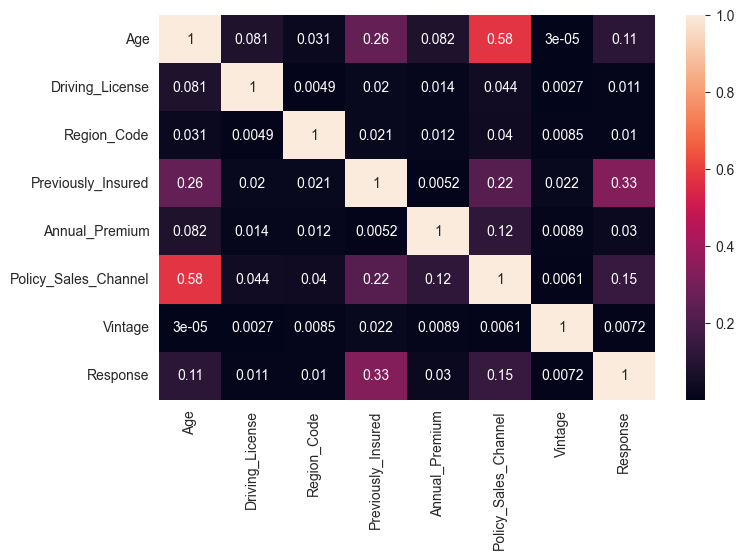

In [9]:
sns.heatmap(data[num_cols].corr().abs(), annot=True)
plt.show()

In [11]:
data["Response"].value_counts()

Response
0    8753
1    1247
Name: count, dtype: int64

In [14]:
cat_cols = data.select_dtypes(include=['object']).columns.tolist()
data = pd.get_dummies(data, columns=cat_cols, drop_first=True)

**Задание 1.** Обучите градиентный бустинг из sklearn на данных и замерьте accuracy и f1-score на тестовой выборке. В качестве параметров ансамбля установите `learning_rate = 1`, `random_state = 1`, `n_estimators = 100`. Изобразите ROC-кривую и посчитайте AUC, оцените качество классификации. (2б)

P.S. для всех прочих моделей в этом домашнем задании тоже фиксируйте `random_state = 1`. Как думаете, что может быть случайного в процедуре обучения градиентного бустинга?

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score, roc_curve, auc

X = data.drop('Response', axis=1)
Y = data['Response']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y,
                                                    random_state=0,
                                                    shuffle=True,
                                                    test_size=0.2)

In [17]:
from sklearn.ensemble import GradientBoostingClassifier

### Your code is here

gb = GradientBoostingClassifier(learning_rate=1, n_estimators=100, random_state=1)
gb.fit(X_train, Y_train)

GradientBoostingClassifier(learning_rate=1, random_state=1)

              precision    recall  f1-score   support

           0       0.90      0.93      0.92      1770
           1       0.31      0.24      0.27       230

    accuracy                           0.85      2000
   macro avg       0.61      0.59      0.59      2000
weighted avg       0.84      0.85      0.84      2000

ROC-AUC: 0.828


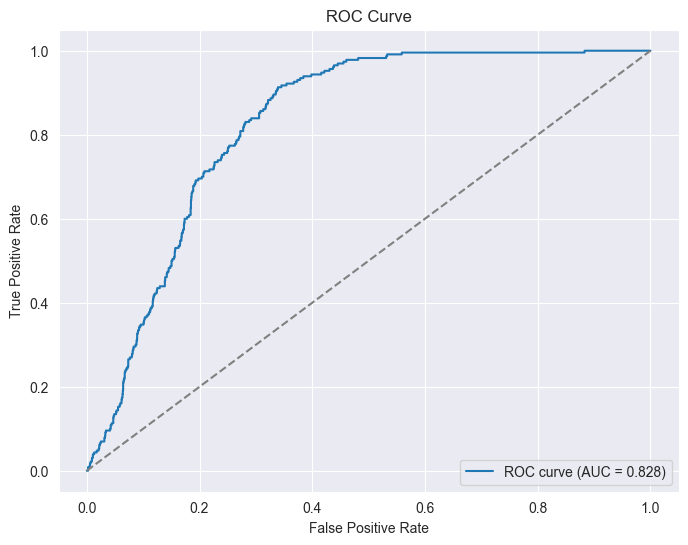

In [25]:
print(classification_report(Y_test, gb.predict(X_test)))

fpr, tpr, thresholds = roc_curve(Y_test, gb.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

print(f"ROC-AUC: {round(roc_auc, 3)}")

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label="ROC curve (AUC = %0.3f)" % roc_auc)
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")  # Diagonal line (random classifier)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

**Задание 2.** Переберите параметры `n_estimators` и `learning_rate` по двумерной сетке. При обучении в цикле сразу считайте f1-score на тестовой выборке и сохраняйте результат в матрицу. Для какого алгоритма качество окажется максимальным?

Постройте кривые для метрики f1-score в зависимости от числа шагов для нескольких learning_rate. Изобразите heatmap полученной матрицы. Сделайте вывод, как количество шагов влияет на качество совместно с различной скоростью обучения? (2б)

P.S. для подсчета f1-score передайте в функцию параметр `average='weighted'`, чтобы учитывался еще и баланс классов (вспомните микро/макро-усреднения).

In [26]:
### Задаем сетку параметров

n_estimators_list = [5, 10, 20, 50, 100, 200, 700, 1000]
learning_rate_list = [1, 0.1, 0.01]

In [28]:
### Your code is here
f1_scores = []

for n_estimator in n_estimators_list:
    f1_row = []

    for learning_rate in learning_rate_list:
        gb = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate=learning_rate)
        gb.fit(X_train, Y_train)

        f1 = f1_score(Y_test, gb.predict(X_test), average="weighted")
        f1_row.append(f1)

    f1_scores.append(f1_row)



In [31]:
np.array(f1_scores).max().round(3)

np.float64(0.845)

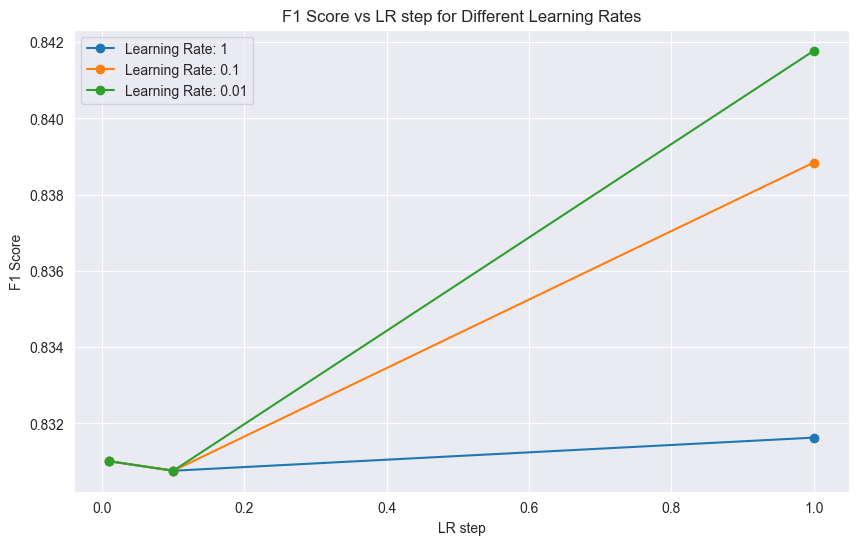

In [32]:
plt.figure(figsize=(10, 6))

for i, learning_rate in enumerate(learning_rate_list):
    plt.plot(learning_rate_list, f1_scores[i], label=f"Learning Rate: {learning_rate}", marker="o")

plt.xlabel("LR step")
plt.ylabel("F1 Score")
plt.title("F1 Score vs LR step for Different Learning Rates")
plt.legend()
plt.show()

**Задание 3.** Вам потребуется обучить 4 модели и посчитать метрику f1-score на тестовой и обучающей выборках для каждой модели. 
1. Случайный лес с максимальной глубиной деревьев 5,
2. Случайный лес с максимальной глубиной деревьев 5000,
3. Градиентный бустинг с максимальной глубиной деревьев 5,
4. Градиентный бустинг с максимальной глубиной деревьев 5000.

Для каждой модели перебирайте значения `n_estimators`, как в предыдущем задании. Отрисуйте графики зависимости f1-score от количества шагов, используя `average='weighted'` для учёта баланса классов. 

Если в качестве базовой модели брать неглубокие деревья, то какая модель лучше запоминает обучающую выборку: случайный лес или градиентный бустинг? Какая из них лучше предсказывает на тестовой выборке? Как изменятся ответы, если базовая модель - это глубокое решающее дерево?

Подвержен ли переобучению случайный лес и градиентный бустинг? Как это отражается на графиках? (4б)

In [35]:
from sklearn.ensemble import RandomForestClassifier

n_estimators_list = [2, 3, 4, 5, 10, 20, 50, 70, 100, 200, 700, 1000, 2000]

### Your code is here
result = {}

for max_depth in [5, 5000]:
    res_rf = []
    res_gb = []
    for n_estimator in n_estimators_list:
        rf = RandomForestClassifier(n_estimators=n_estimator, max_depth=max_depth)
        rf.fit(X_train, Y_train)

        f1 = f1_score(Y_test, rf.predict(X_test), average="weighted")
        res_rf.append(round(f1, 3))


        gd = GradientBoostingClassifier(n_estimators=n_estimator, max_depth=max_depth)
        gd.fit(X_train, Y_train)

        f1 = f1_score(Y_test, gd.predict(X_test), average="weighted")
        res_gb.append(round(f1, 3))

    result[f"rf_{max_depth}"] = res_rf
    result[f"gb_{max_depth}"] = res_gb


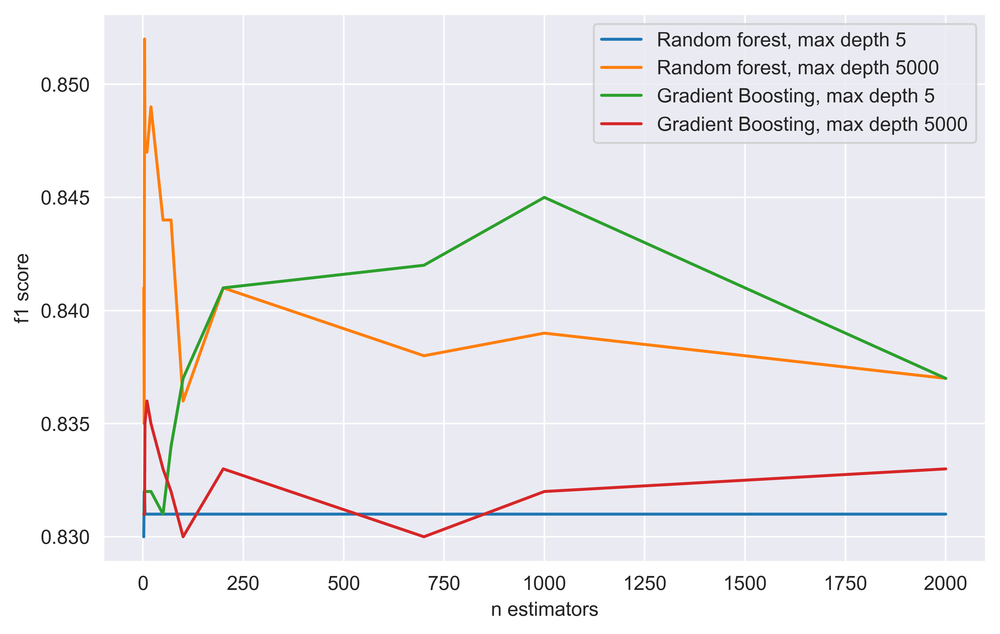

In [36]:
fig = plt.figure(dpi=500)

plt.plot(n_estimators_list, result["rf_5"])
plt.plot(n_estimators_list, result["rf_5000"])
plt.plot(n_estimators_list, result["gb_5"])
plt.plot(n_estimators_list, result["gb_5000"])

plt.xlabel("n estimators")
plt.ylabel("f1 score")
plt.legend(["Random forest, max depth 5", "Random forest, max depth 5000",
            "Gradient Boosting, max depth 5", "Gradient Boosting, max depth 5000"])

plt.show()

**Задание 4.** Установите библиотеку `catboost`. Главной особенностью catboost явялется наличие встроенной обработки категориальных признаков. Для каждого категориального столбца вычисляется следующее значение
$$
avg\_target = \dfrac{countInClass + prior}{totalCount + 1},
$$
* countInClass - количество объектов положительного класса для данной категории **до текущего объекта**,
* prior - некоторая константа для числителя, обычно равна доле положительного класса в таргете,
* totalCount - количество наблюдаемых категорий вплоть **до текущего** с той же категорией, что и у текущего.

Так как первые такие значения будут иметь больший разброс, чем последние, то выборку перемешивают несколько раз и полученные статистики усредняют. 
В отличие от target encoder подсчитанные значения зависят от наблюдаемой истории, т.е. вычисляются только из наблюдений до них, таким образом не происходит target leakage. 

Почитать подробнее можно здесь: [Transforming categorical features](https://catboost.ai/en/docs/concepts/algorithm-main-stages_cat-to-numberic)

Обучите CatBoostClassifier с дефолтными параметрами. Используйте датасет до  (разбейте на train/test по старой логике с тем же random state'ом). Категориальные колонки передайте в параметр `cat_features` метода `fit`. Catboost сам с ними разберется.

Сравните качество с моделью из предыдущего задания. Стало ли лучше?

Сравните feature importances в модели из задания 2 и в catboost с помощью соответствующих методов, изобразите их, используя `barplot`. \
Какие признаки стали более важными с новым методом кодирования? (4б)

In [38]:
from catboost import CatBoostClassifier

### Your code is here

data2 = pd.read_csv("vehicle_insurance.csv")

X_2 = data2.drop("Response", axis=1)
Y_2 = data2["Response"]

X_train_2, X_test_2, Y_train_2, Y_test_2 = train_test_split(X_2, Y_2, test_size=0.2,
                                                                      random_state=0,
                                                                      shuffle=True)

In [40]:
cat_gb = CatBoostClassifier()
cat_gb.fit(X_train_2, Y_train_2,
            cat_features=cat_cols,
            verbose=False)

In [41]:
print(classification_report(Y_test_2, cat_gb.predict(X_test_2), digits=3))

              precision    recall  f1-score   support

           0      0.889     0.987     0.935      1770
           1      0.343     0.052     0.091       230

    accuracy                          0.879      2000
   macro avg      0.616     0.520     0.513      2000
weighted avg      0.826     0.879     0.838      2000



<Figure size 1000x800 with 0 Axes>

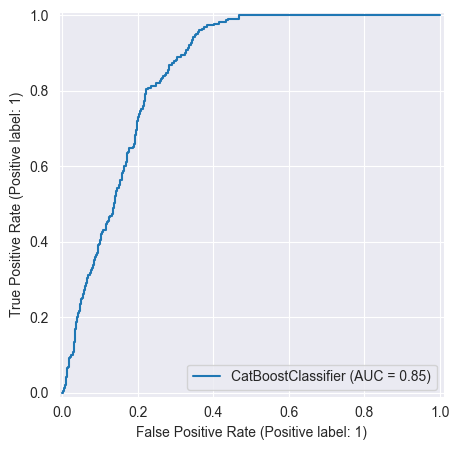

In [46]:
from sklearn.metrics import RocCurveDisplay

plt.figure(figsize=(10, 8))
RocCurveDisplay.from_estimator(cat_gb, X_test_2, Y_test_2)
plt.show()

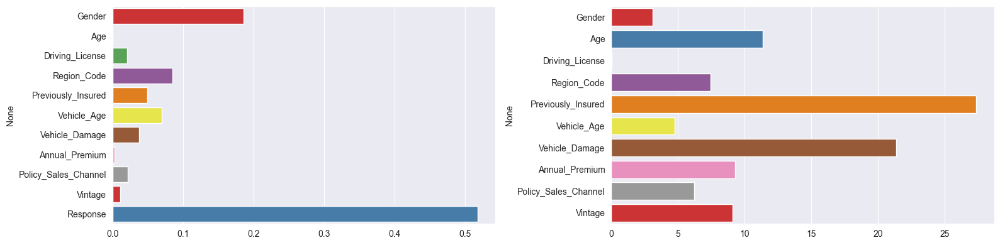

In [53]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

sns.barplot(x=gb.feature_importances_, y=data2.columns, ax=axes[0], palette="Set1")

sns.barplot(x=cat_gb.feature_importances_, y=X_2.columns, ax=axes[1], palette="Set1")

plt.tight_layout()
plt.show()

**Задание 5.** Установите библиотеку `lightgbm`. На сегодняшний день это наиболее быстрый метод градиентного бустинга, при этом расходующий небольшое количество оперативной памяти. Достигает он этого за счет построения деревьев вглубь по листьям (leaf-wise), а не по уровням (level-wise), как другие методы, например XGBoost. 
Более понятно это на картинке:

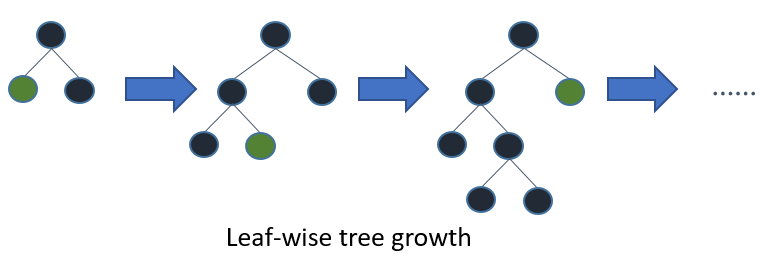

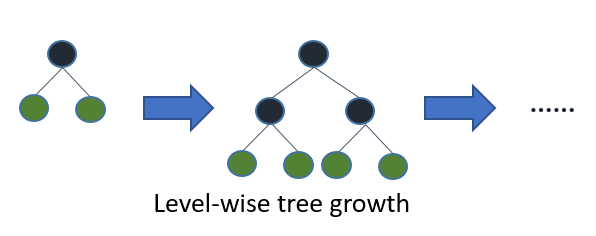

В то время, как XGBoost за раз разделяет вершины на целом уровне той же глубины, LightGBM разделяет одну вершину за раз. Отсюда прирост в скорости.

Обучите `LGBMClassifier` на изначальных(закодированных) данных и добейтесь максимального качества на тестовой выборке, перебрав параметры глубины деревьев, количества шагов, скорости обучения и т.д.

In [54]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

params = {'n_estimators': [100, 500, 1000, 2000],
          'max_depth': [2, 3, 5, 100],
          'learning_rate': [0.1, 0.01, 0.001]}

### Your code is here

light_gb = LGBMClassifier()
light_gb.fit(X_train, Y_train)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1017, number of negative: 6983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.127125 -> initscore=-1.926622
[LightGBM] [Info] Start training from score -1.926622


LGBMClassifier()

In [57]:
print(classification_report(Y_test, light_gb.predict(X_test), digits=3))

              precision    recall  f1-score   support

           0      0.891     0.977     0.932      1770
           1      0.322     0.083     0.131       230

    accuracy                          0.875      2000
   macro avg      0.607     0.530     0.532      2000
weighted avg      0.826     0.875     0.840      2000



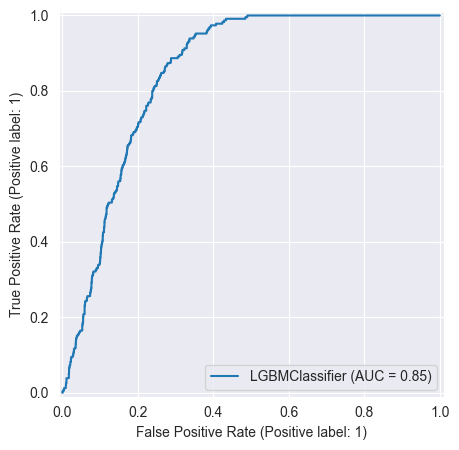

In [58]:
RocCurveDisplay.from_estimator(light_gb, X_test, Y_test)
plt.show()

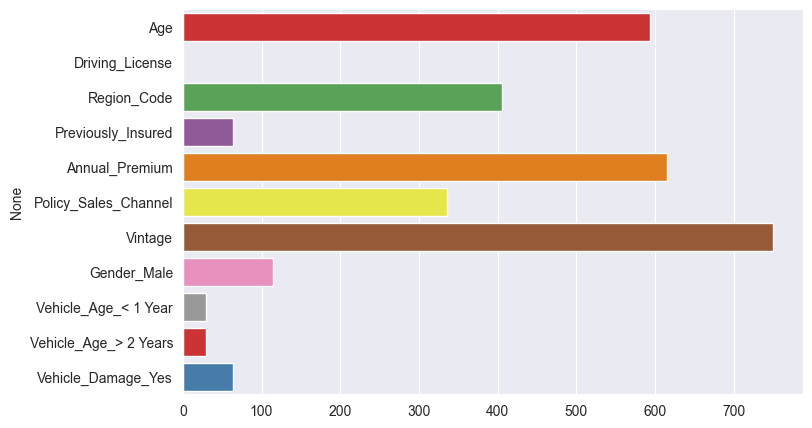

In [60]:
sns.barplot(x=light_gb.feature_importances_, y=X.columns, palette="Set1")
plt.show()

In [64]:
search = GridSearchCV(light_gb, params)

search.fit(X_train, Y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 814, number of negative: 5586
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 6400, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.127188 -> initscore=-1.926058
[LightGBM] [Info] Start training from score -1.926058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

In [66]:
print(classification_report(Y_test, search.predict(X_test), digits=3))

              precision    recall  f1-score   support

           0      0.885     1.000     0.939      1770
           1      0.000     0.000     0.000       230

    accuracy                          0.885      2000
   macro avg      0.443     0.500     0.469      2000
weighted avg      0.783     0.885     0.831      2000

